In [22]:
import numpy as np
import sys
sys.path.insert(0, '../') 
from RNN_model_GRAD import *
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
try:
    import ujson as json
except ImportError:
    import json
import scipy.linalg as slin
from mpl_toolkits.mplot3d import Axes3D
import networkx as nx
import matplotlib.colors as colors
import matplotlib.cm as cm
import matplotlib as mpl
from numba import jit, njit
import scipy

# Loading Trained Networks

Loading the 10 weight matrices for each task

## Perception Task

In [23]:
weight_histories_perception = []
num_networks=10
for i in range(num_networks):
    print(i)
    with open('Perception_Task/relu/256_nodes/weight_history_{0}.json'.format(i)) as f:
        weight_history = json.load(f)
    weight_histories_perception.append(weight_history)

0
1
2
3
4
5
6
7
8
9


**Defining the 10 perception networks**

In [24]:
num_nodes = 256
time_constant = 100 #ms
timestep = 10 #ms
noise_strength = 0.01
input_weights_perception = []
perception_networks = []
for i in range(num_networks):
    weight_history = weight_histories_perception[i]
    noise_weights = np.array(weight_history['noise weights'])
    bias_weights = np.array(weight_history['bias'])
    input_weights = np.array(weight_history['input weights'])
    output_weight_matrix = np.array(weight_history['output weights'])
    connectivity_matrix = np.array(weight_history['connectivity matrix'])
    final_weights = np.array(weight_history['trained weights'][-1])


    weight_matrix = tf.Variable(final_weights)
    connectivity_matrix = tf.constant(connectivity_matrix)

    input_weight_matrix = tf.constant(np.vstack((bias_weights, noise_weights, input_weights)))   
    input_weights_perception.append(input_weight_matrix)
    init_activations = tf.constant(np.zeros((num_nodes, 1)))
    output_weight_matrix = tf.constant(output_weight_matrix)

    network = RNN(weight_matrix, connectivity_matrix, init_activations, output_weight_matrix, time_constant = time_constant,
                 timestep = timestep,activation_func = keras.activations.relu, output_nonlinearity = lambda x : x)
    perception_networks.append(network)

## Decision Task

In [25]:
weight_histories_decision = []
for i in range(num_networks):
    print(i)
    with open('Decision_Task/relu/256_nodes/weight_history_{0}.json'.format(i)) as f:
        weight_history = json.load(f)
    weight_histories_decision.append(weight_history)

0
1
2
3
4
5
6
7
8
9


**Defining the 10 decision networks**

In [26]:
num_nodes = 256
time_constant = 100 #ms
timestep = 10 #ms
noise_strength = 0.01
input_weights_decision = []
decision_networks = []
for i in range(num_networks):
    weight_history = weight_histories_decision[i]
    noise_weights = np.array(weight_history['noise weights'])
    bias_weights = np.array(weight_history['bias'])
    input1_weights = np.array(weight_history['input1 weights'])
    input2_weights = np.array(weight_history['input2 weights'])
    output_weight_matrix = np.array(weight_history['output weights'])
    connectivity_matrix = np.array(weight_history['connectivity matrix'])
    final_weights = np.array(weight_history['trained weights'][-1])


    weight_matrix = tf.Variable(final_weights)
    connectivity_matrix = tf.constant(connectivity_matrix)

    input_weight_matrix = tf.constant(np.vstack((bias_weights, noise_weights, input1_weights, input2_weights)))   
    input_weights_decision.append(input_weight_matrix)
    init_activations = tf.constant(np.zeros((num_nodes, 1)))
    output_weight_matrix = tf.constant(output_weight_matrix)

    network = RNN(weight_matrix, connectivity_matrix, init_activations, output_weight_matrix, time_constant = time_constant,
                 timestep = timestep,activation_func = keras.activations.relu, output_nonlinearity = lambda x : x)
    decision_networks.append(network)

# Distribution of Weights

## Perception Task

Weights approximately follow a Gaussian Distribution before, during and after training.

Evolution of standard deviation and mean of weights during training

In [6]:
stds = []
means=[]
for i,weight_history in enumerate(weight_histories_perception):
    trained_weights = weight_history['trained weights']
    training_length = len(trained_weights)
    stds_per_network = []
    means_per_network = []
    for weight_matrix in trained_weights:
        stds_per_network.append(np.std(weight_matrix))
        means_per_network.append(np.mean(weight_matrix))
    stds.append(stds_per_network)
    means.append(means_per_network)
stds = np.array(stds)
mean_stds_perception = np.mean(stds**2, axis=0)
std_stds_perception = np.std(stds**2, axis=0)
mean_means_perception = np.mean(means, axis=0)
std_means_perception = np.std(means, axis=0)

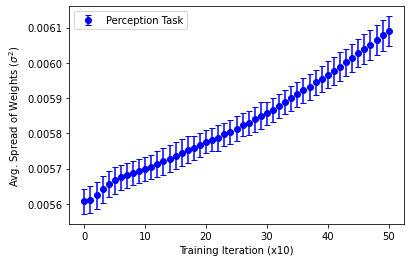

In [7]:
plt.errorbar(range(training_length), mean_stds_perception,yerr=std_stds_perception,fmt='bo',capsize=3, label = 'Perception Task')
plt.ylabel(r'Avg. Spread of Weights ($\sigma^2$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

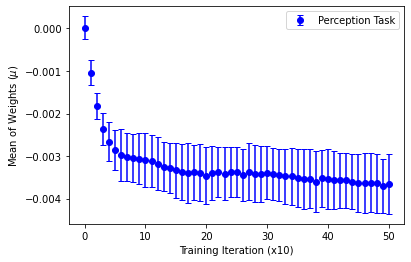

In [8]:
plt.errorbar(range(training_length), mean_means_perception,yerr=std_means_perception,fmt='bo',capsize=3, label = 'Perception Task')
plt.ylabel(r'Mean of Weights ($\mu$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

## Decision Task

Weights approximately follow a Gaussian distribution before, during and after training

Evolution of standard deviation and mean of weights during training

In [9]:
stds = []
means=[]
for i,weight_history in enumerate(weight_histories_decision):
    trained_weights = weight_history['trained weights']
    training_length = len(trained_weights)
    stds_per_network = []
    means_per_network = []
    for weight_matrix in trained_weights:
        stds_per_network.append(np.std(weight_matrix))
        means_per_network.append(np.mean(weight_matrix))
    stds.append(stds_per_network)
    means.append(means_per_network)
stds=np.array(stds)
mean_stds_decision = np.mean(stds**2, axis=0)
std_stds_decision = np.std(stds**2, axis=0)
mean_means_decision = np.mean(means, axis=0)
std_means_decision = np.std(means, axis=0)

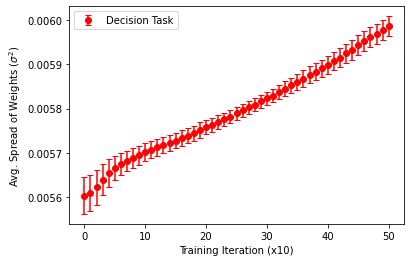

In [10]:
plt.errorbar(range(training_length), mean_stds_decision,yerr=std_stds_decision,fmt='ro',capsize=3, label = 'Decision Task')
plt.ylabel(r'Avg. Spread of Weights ($\sigma^2$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

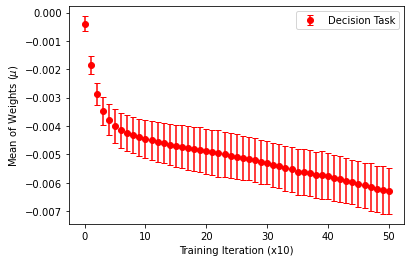

In [11]:
plt.errorbar(range(training_length), mean_means_decision,yerr=std_means_decision,fmt='ro',capsize=3, label = 'Decision Task')
plt.ylabel(r'Mean of Weights ($\mu$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

## Combined Plots

STD Plot

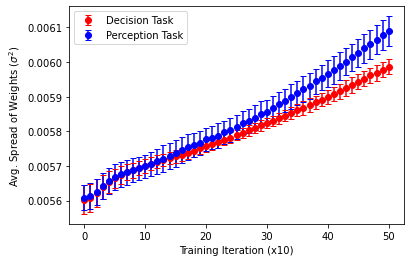

In [12]:
plt.errorbar(range(training_length), mean_stds_decision,yerr=std_stds_decision,fmt='ro',capsize=3, label = 'Decision Task')
plt.errorbar(range(training_length), mean_stds_perception,yerr=std_stds_perception,fmt='bo',capsize=3, label = 'Perception Task')
plt.ylabel(r'Avg. Spread of Weights ($\sigma^2$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

Mean Plot

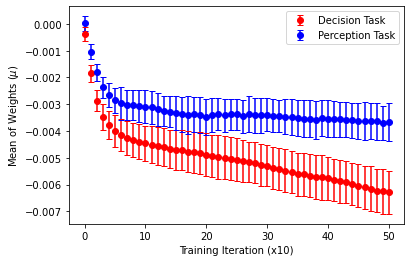

In [13]:
plt.errorbar(range(training_length), mean_means_decision,yerr=std_means_decision,fmt='ro',capsize=3, label = 'Decision Task')
plt.errorbar(range(training_length), mean_means_perception,yerr=std_means_perception,fmt='bo',capsize=3, label = 'Perception Task')
plt.ylabel(r'Mean of Weights ($\mu$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

# Distribution of Eigenvalues

## Perception Task

Evolution of std, mean and max of eigenvalues of weight matrix during training

In [17]:
stds = []
means=[]
maxes = []
for i,weight_history in enumerate(weight_histories_perception):
    trained_weights = weight_history['trained weights']
    training_length = len(trained_weights)
    stds_per_network = []
    means_per_network = []
    maxes_per_network = []
    for weight_matrix in trained_weights:
        eig = np.abs(np.linalg.eigvals(weight_matrix))
        stds_per_network.append(np.std(eig))
        means_per_network.append(np.mean(eig))
        maxes_per_network.append(np.max(eig))
    stds.append(stds_per_network)
    means.append(means_per_network)
    maxes.append(maxes_per_network)
stds = np.array(stds)
mean_stds_perception = np.mean(stds**2, axis=0)
std_stds_perception = np.std(stds**2, axis=0)
mean_means_perception = np.mean(means, axis=0)
std_means_perception = np.std(means, axis=0)
mean_maxes_perception = np.mean(maxes, axis=0)
std_maxes_perception = np.std(maxes, axis=0)

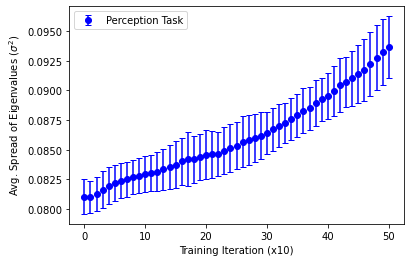

In [18]:
plt.errorbar(range(training_length), mean_stds_perception,yerr=std_stds_perception,fmt='bo',capsize=3, label = 'Perception Task')
plt.ylabel(r'Avg. Spread of Eigenvalues ($\sigma^2$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

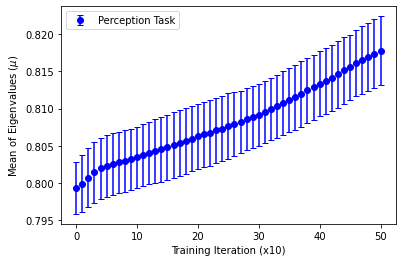

In [19]:
plt.errorbar(range(training_length), mean_means_perception,yerr=std_means_perception,fmt='bo',capsize=3, label = 'Perception Task')
plt.ylabel(r'Mean of Eigenvalues ($\mu$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

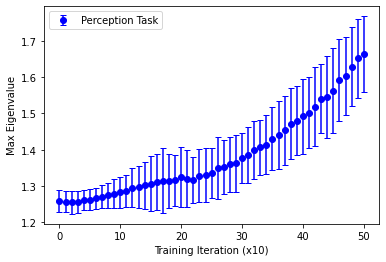

In [20]:
plt.errorbar(range(training_length), mean_maxes_perception,yerr=std_maxes_perception,fmt='bo',capsize=3, label = 'Perception Task')
plt.ylabel(r'Max Eigenvalue')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

## Decision Task

Evolution of std, mean and max of eigenvalues of weight matrix during training

In [21]:
stds = []
means=[]
maxes = []
for i,weight_history in enumerate(weight_histories_decision):
    trained_weights = weight_history['trained weights']
    training_length = len(trained_weights)
    stds_per_network = []
    means_per_network = []
    maxes_per_network = []
    for weight_matrix in trained_weights:
        eig = np.abs(np.linalg.eigvals(weight_matrix))
        stds_per_network.append(np.std(eig))
        means_per_network.append(np.mean(eig))
        maxes_per_network.append(np.max(eig))
    stds.append(stds_per_network)
    means.append(means_per_network)
    maxes.append(maxes_per_network)
stds = np.array(stds)
mean_stds_decision = np.mean(stds**2, axis=0)
std_stds_decision = np.std(stds**2, axis=0)
mean_means_decision = np.mean(means, axis=0)
std_means_decision = np.std(means, axis=0)
mean_maxes_decision = np.mean(maxes, axis=0)
std_maxes_decision = np.std(maxes, axis=0)

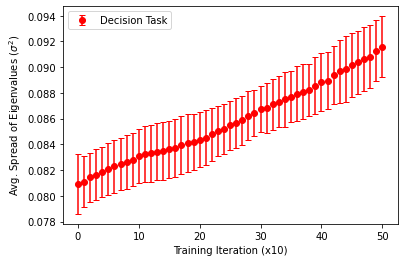

In [22]:
plt.errorbar(range(training_length), mean_stds_decision,yerr=std_stds_decision,fmt='ro',capsize=3, label = 'Decision Task')
plt.ylabel(r'Avg. Spread of Eigenvalues ($\sigma^2$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

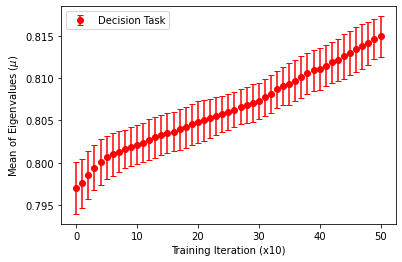

In [23]:
plt.errorbar(range(training_length), mean_means_decision,yerr=std_means_decision,fmt='ro',capsize=3, label = 'Decision Task')
plt.ylabel(r'Mean of Eigenvalues ($\mu$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

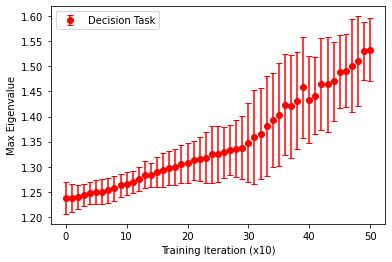

In [24]:
plt.errorbar(range(training_length), mean_maxes_decision,yerr=std_maxes_decision,fmt='ro',capsize=3, label = 'Decision Task')
plt.ylabel(r'Max Eigenvalue')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

## Combined Plots

STD Plot

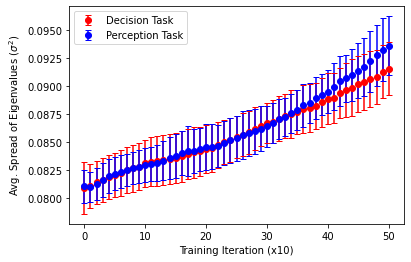

In [25]:
plt.errorbar(range(training_length), mean_stds_decision,yerr=std_stds_decision,fmt='ro',capsize=3, label = 'Decision Task')
plt.errorbar(range(training_length), mean_stds_perception,yerr=std_stds_perception,fmt='bo',capsize=3, label = 'Perception Task')
plt.ylabel(r'Avg. Spread of Eigenvalues ($\sigma^2$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

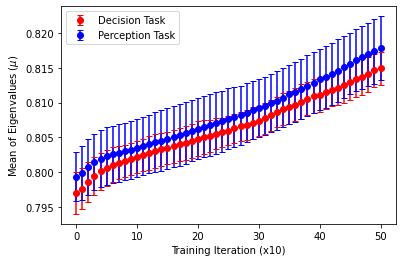

In [26]:
plt.errorbar(range(training_length), mean_means_decision,yerr=std_means_decision,fmt='ro',capsize=3, label = 'Decision Task')
plt.errorbar(range(training_length), mean_means_perception,yerr=std_means_perception,fmt='bo',capsize=3, label = 'Perception Task')
plt.ylabel(r'Mean of Eigenvalues ($\mu$)')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

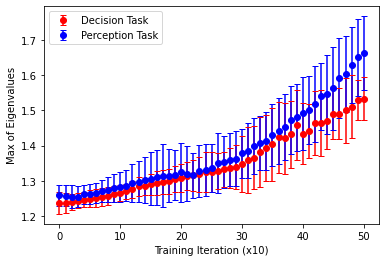

In [27]:
plt.errorbar(range(training_length), mean_maxes_decision,yerr=std_maxes_decision,fmt='ro',capsize=3, label = 'Decision Task')
plt.errorbar(range(training_length), mean_maxes_perception,yerr=std_maxes_perception,fmt='bo',capsize=3, label = 'Perception Task')
plt.ylabel(r'Max of Eigenvalues')
plt.xlabel('Training Iteration (x10)')
plt.legend()
plt.show()

# Principal Values of Weight Matrix

## Perception Task

In [33]:
net_values_perception = []
net_variance_prop_perception = []

num_singular_values = 10
for weight_history in weight_histories_perception:
    weight_history = weight_history['trained weights']
    values = []
    variance_prop = []
    for mat in tqdm(weight_history):
        u, s, vh = np.linalg.svd(mat)
        values.append(s[:num_singular_values])
        tot_variance = np.dot(s,s)
        variance_prop.append([val**2/tot_variance for val in s])
    net_values_perception.append(values)
    net_variance_prop_perception.append(variance_prop)

100%|██████████████████████████████████████████████████████████████████████████████████| 51/51 [00:04<00:00, 10.73it/s]


In [34]:
mean_vals_perception = np.mean(net_values_perception, axis=0)
std_vals_perception = np.std(net_values_perception, axis=0)
mean_var_prop_perception = np.mean(net_variance_prop_perception, axis=0)
std_var_prop_perception = np.std(net_variance_prop_perception, axis=0)

Plotting evolution of the singular values

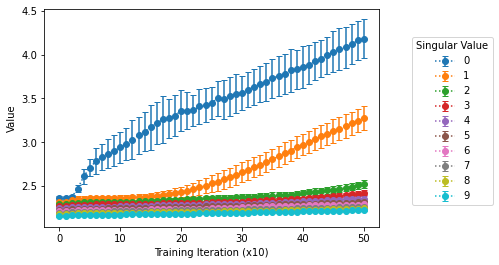

In [35]:
#The i'th column is the evolution of the i'th singular value
num_total_iters = mean_vals_perception[:, 0].shape[0]
fig, ax = plt.subplots()
for i in range(num_singular_values): 
    plt.errorbar(range(num_total_iters), mean_vals_perception[:, i],yerr = std_vals_perception[:,i], fmt='o:', capsize=3, label=str(i))
plt.xlabel('Training Iteration (x10)')
plt.ylabel('Value')
plt.legend(title='Singular Value', loc=[1.1,.1])
plt.ylim(2,5)
plt.show()


Plotting Variance Proportion

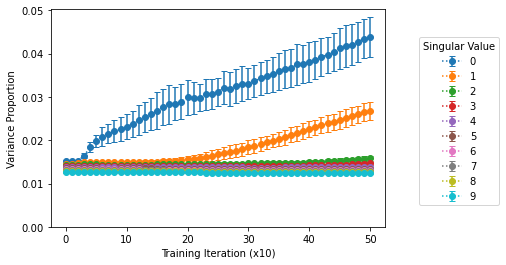

In [36]:
#The i'th column is the evolution of the i'th singular value
num_total_iters = mean_var_prop_perception[:, 0].shape[0]

fig, ax = plt.subplots()
for i in range(num_singular_values): 
    plt.errorbar(range(num_total_iters), mean_var_prop_perception[:, i],yerr = std_var_prop_perception[:,i], fmt='o:', capsize=3, label=str(i))
plt.xlabel('Training Iteration (x10)')
plt.ylabel('Variance Proportion')
plt.legend(title='Singular Value',loc=[1.1,.1])
plt.ylim(0,.05)
plt.show()


## Decision Task

In [23]:
net_values_decision = []
net_variance_prop_decision = []

num_singular_values = 10
for weight_history in weight_histories_decision:
    weight_history = weight_history['trained weights']
    values = []
    variance_prop = []
    for mat in tqdm(weight_history):
        u, s, vh = np.linalg.svd(mat)
        values.append(s[:num_singular_values])
        tot_variance = np.dot(s,s)
        variance_prop.append([val**2/tot_variance for val in s])
    net_values_decision.append(values)
    net_variance_prop_decision.append(variance_prop)

100%|██████████████████████████████████████████████████████████████████████████████████| 51/51 [00:05<00:00,  9.02it/s]


In [24]:
mean_vals_decision = np.mean(net_values_decision, axis=0)
std_vals_decision = np.std(net_values_decision, axis=0)
mean_var_prop_decision = np.mean(net_variance_prop_decision, axis=0)
std_var_prop_decision = np.std(net_variance_prop_decision, axis=0)

Plotting evolution of the singular values

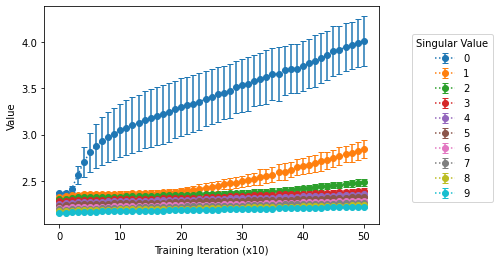

In [29]:
#The i'th column is the evolution of the i'th singular value
num_total_iters = mean_vals_decision[:, 0].shape[0]
fig, ax = plt.subplots()
for i in range(num_singular_values): 
    plt.errorbar(range(num_total_iters), mean_vals_decision[:, i],yerr = std_vals_decision[:,i], fmt='o:', capsize=3, label=str(i))
plt.xlabel('Training Iteration (x10)')
plt.ylabel('Value')
plt.legend(title='Singular Value', loc=[1.1,.1])
plt.ylim(2,5)
plt.show()


Plotting Variance Proportion

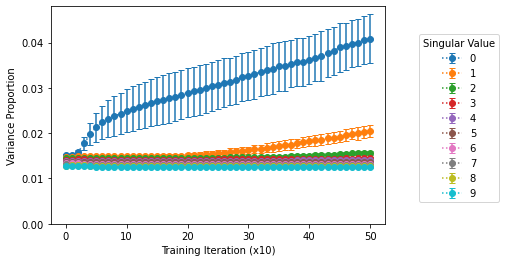

In [32]:
#The i'th column is the evolution of the i'th singular value
num_total_iters = mean_var_prop_decision[:, 0].shape[0]

fig, ax = plt.subplots()
for i in range(num_singular_values): 
    plt.errorbar(range(num_total_iters), mean_var_prop_decision[:, i],yerr = std_var_prop_decision[:,i], fmt='o:', capsize=3, label=str(i))
plt.xlabel('Training Iteration (x10)')
plt.ylabel('Variance Proportion')
plt.legend(title='Singular Value',loc=[1.1,.1])
plt.ylim(0,.05)
plt.show()


# Schur Decomposition

## Combined

In [39]:
values_perception=[]
for weight_history in weight_histories_perception:
    weight_history = weight_history['trained weights']
    values = []
    for mat in tqdm(weight_history):
        T, Z = slin.schur(mat)
        values.append(np.linalg.norm(T))
    values_perception.append(values)
    

100%|██████████████████████████████████████████████████████████████████████████████████| 51/51 [00:06<00:00,  8.01it/s]


In [40]:
values_decision=[]
for weight_history in weight_histories_decision:
    weight_history = weight_history['trained weights']
    values = []
    for mat in tqdm(weight_history):
        T, Z = slin.schur(mat)
        values.append(np.linalg.norm(T))
    values_decision.append(values)

100%|██████████████████████████████████████████████████████████████████████████████████| 51/51 [00:06<00:00,  7.78it/s]


In [43]:
mean_vals_decision = np.mean(values_decision,axis=0)
std_vals_decision = np.std(values_decision, axis=0)
mean_vals_perception = np.mean(values_perception, axis=0)
std_vals_perception=np.std(values_perception, axis=0)

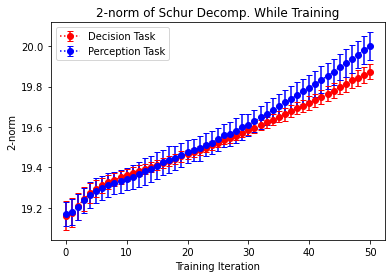

In [44]:
num_total_iters = mean_vals_decision.size

fig, ax = plt.subplots()
plt.errorbar(range(num_total_iters), mean_vals_decision, yerr = std_vals_decision, capsize=3, fmt='ro:', label='Decision Task')
plt.errorbar(range(num_total_iters), mean_vals_perception, yerr = std_vals_perception, capsize=3, fmt='bo:', label='Perception Task')
plt.xlabel('Training Iteration')
plt.ylabel('2-norm')
plt.title('2-norm of Schur Decomp. While Training')
plt.legend()
plt.show()

# Right vs Left Eigenvector

In [27]:
def left_right_eig(A):
    # Right and left eigenvector decomposition of A
    eigvalsA, RA = scipy.linalg.eig(A)
    eigorder = np.argsort(np.abs(eigvalsA))[::-1]
    RA = RA[:, eigorder]
    eigvalsA = eigvalsA[eigorder]
    
    eigvalsLA, LA = scipy.linalg.eig(np.conjugate(A).T)
    eigorder = []
    for eigval in eigvalsA:
        eig_idx = np.logical_and(np.isclose(np.real(eigvalsLA), np.real(eigval)),
                                 np.isclose(np.imag(eigvalsLA), -1*np.imag(eigval))).nonzero()[0][0]
        eigorder.append(eig_idx)
    
    LA = np.conjugate(LA)
    LA = LA[:, np.array(eigorder)]
    
#     # Check correctness 
#     for i in range(eigvalsA.size):
#         assert(np.all(np.isclose(np.divide(A @ RA[:, i], RA[:, i]), eigvalsA[i])))
#         assert(np.all(np.isclose(np.divide(LA[:, i] @ A, LA[:, i]), eigvalsA[i])))
    
#     assert(np.allclose(A, sum([eigvalsA[i] * (RA[:, i] @ LA[:, i])**(-1) * np.outer(RA[:, i], LA[:, i]) 
#                                for i in range(eigvalsA.size)])))
    
#     # Biorthogonality
#     for i in range(eigvalsA.size):
#         for j in range(eigvalsA.size):
#             if i == j:
#                 continue
#             assert(np.isclose(LA[:, i] @ RA[:, j], 0))
    
#     # Assert we get the right behavior for matrix powers
#     Ak = sum([eigvalsA[i]**2 * (RA[:, i] @ LA[:, i])**(-1) * np.outer(RA[:, i], LA[:, i])
#               for i in range(eigvalsA.size)])
#     assert(np.allclose(Ak, np.linalg.matrix_power(A, 2)))
    return eigvalsA, RA, LA

## Perception Task

In [28]:
values_perception=[]
for weight_history in weight_histories_perception:
    weight_history = weight_history['trained weights']
    values = []
    for mat in tqdm(weight_history):
        dots = []
        eigvals,R,L = left_right_eig(mat)
        for i in range(num_nodes):
            r_vec = R[i]
            l_vec = L[i]
            dot = np.abs(np.dot(r_vec,l_vec))
            dots.append(dot)
        values.append(dots)
    values_perception.append(values)
values_perception = np.mean(values_perception,axis=0)
    

100%|██████████████████████████████████████████████████████████████████████████████████| 51/51 [00:16<00:00,  3.17it/s]


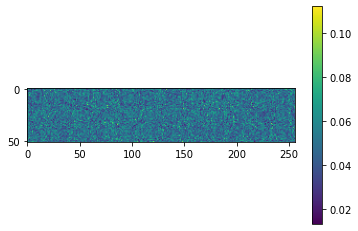

In [29]:
plt.imshow(values_perception)
plt.colorbar()

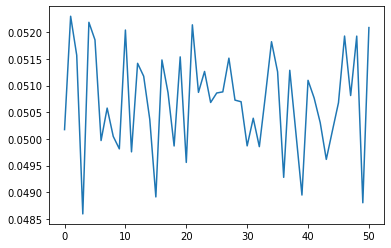

In [30]:
means_perception = np.mean(values_perception, axis=1)
plt.plot(range(51), means_perception)

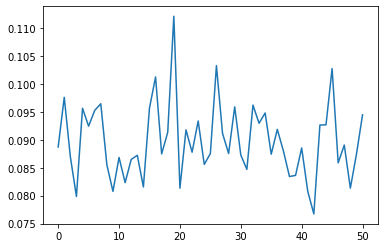

In [31]:
max_perception = np.max(values_perception, axis=1)
plt.plot(range(51), max_perception)

## Decision Task

In [32]:
values_decision=[]
for weight_history in weight_histories_decision:
    weight_history = weight_history['trained weights']
    values = []
    for mat in tqdm(weight_history):
        dots = []
        eigvals,R,L = left_right_eig(mat)
        for i in range(num_nodes):
            r_vec = R[i]
            l_vec = L[i]
            dot = np.abs(np.dot(r_vec,l_vec))
            dots.append(dot)
        values.append(dots)
    values_decision.append(values)
values_decision = np.mean(values_decision,axis=0)
    

100%|██████████████████████████████████████████████████████████████████████████████████| 51/51 [00:15<00:00,  3.31it/s]


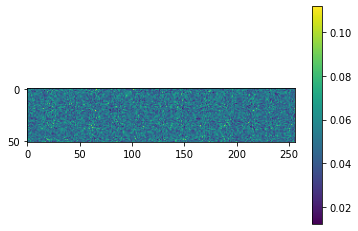

In [33]:
plt.imshow(values_decision)
plt.colorbar()

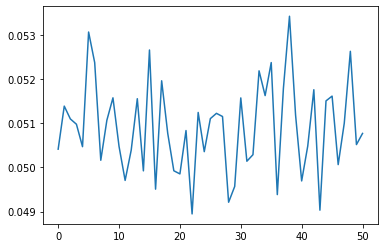

In [34]:
means_decision = np.mean(values_decision, axis=1)
plt.plot(range(51), means_decision)

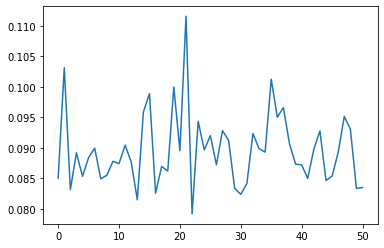

In [35]:
max_decision = np.max(values_decision, axis=1)
plt.plot(range(51), max_decision)

# Weight Matrix Difference

## Perception Task

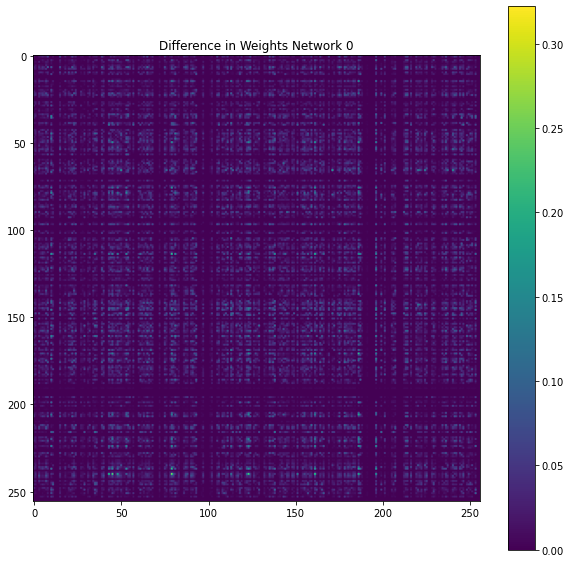

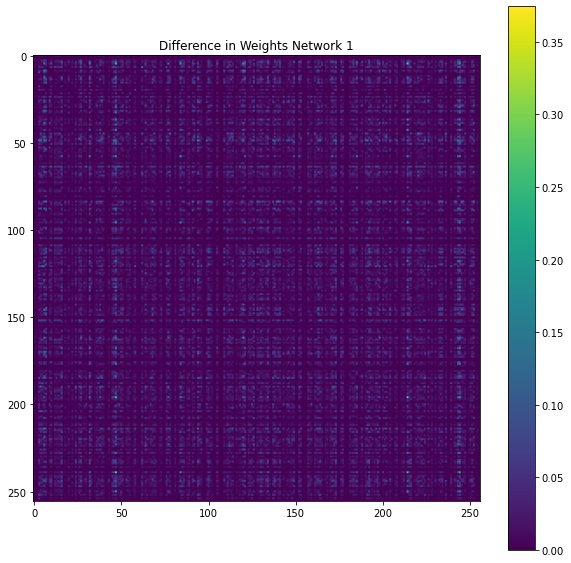

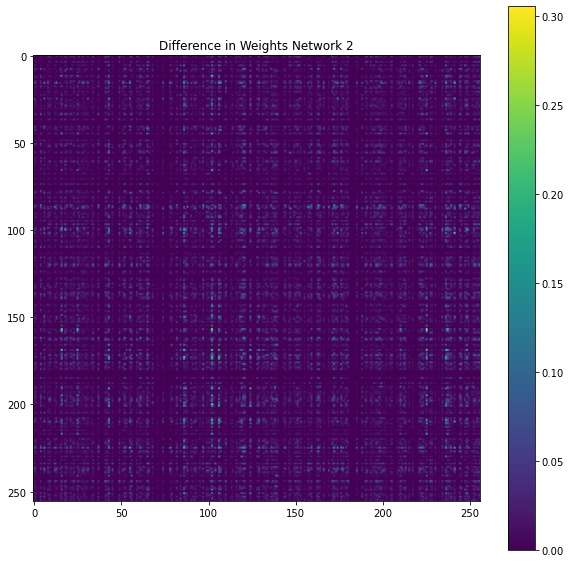

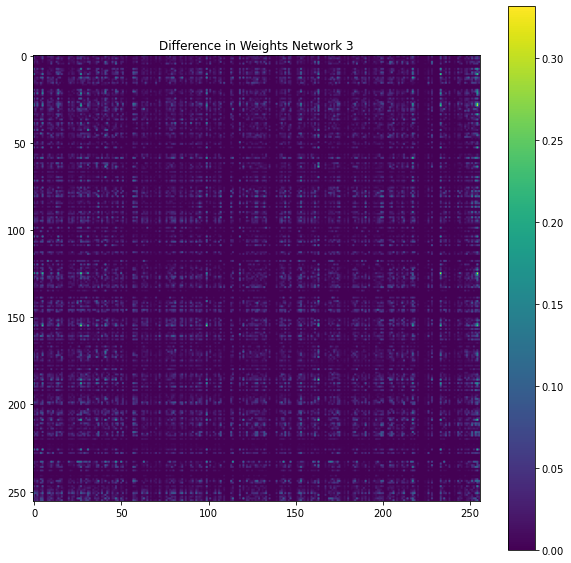

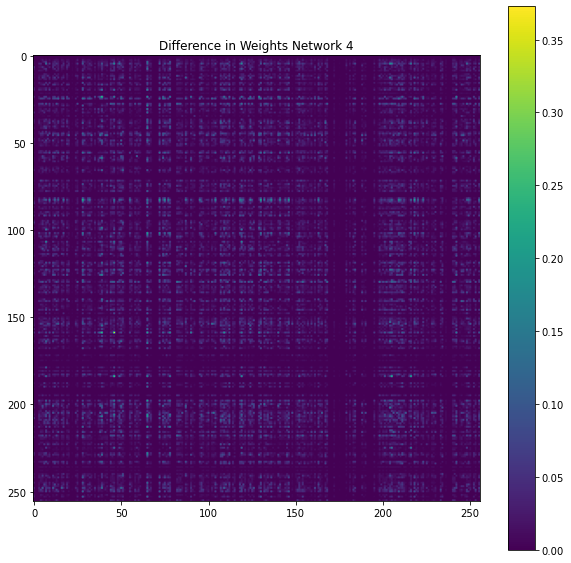

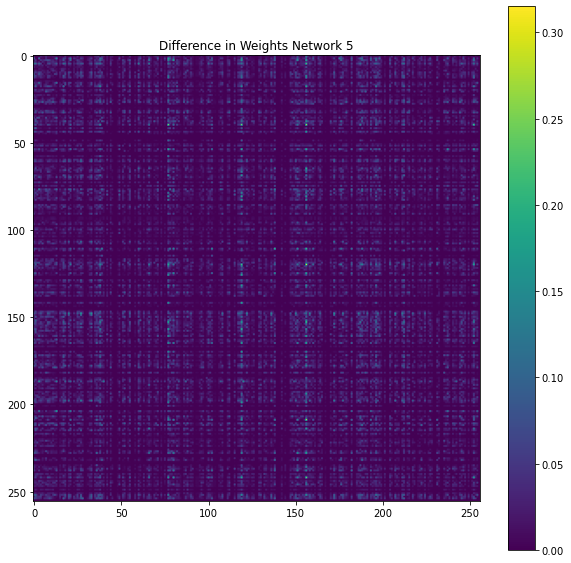

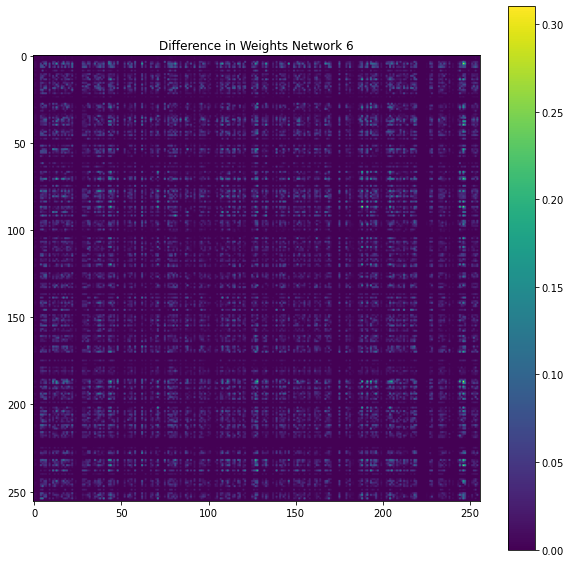

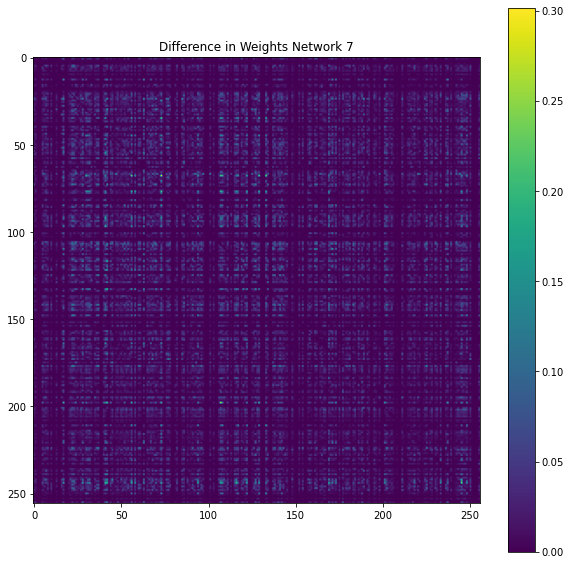

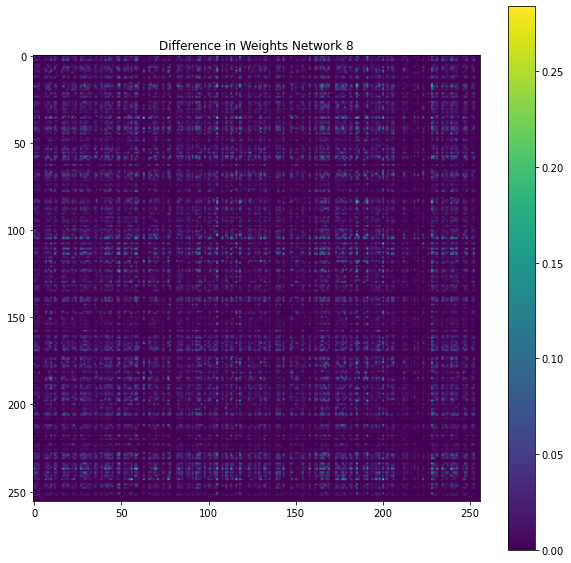

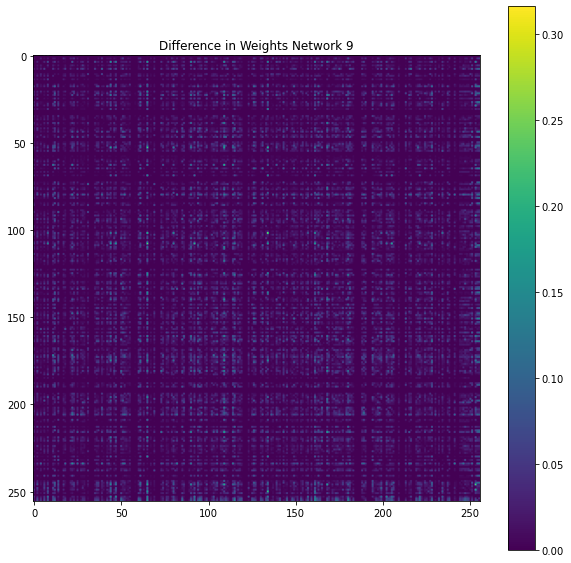

In [36]:
differences_perception = []
sorted_differences_perception = []
for i,weight_history_dict in enumerate(weight_histories_perception):
    weight_histories =weight_history_dict['trained weights']
    difference = np.abs(np.array(weight_histories[0])-np.array(weight_histories[-1]))
    fig, ax = plt.subplots(1,1,figsize=(10,10))
    plt.imshow(difference)
    plt.title('Difference in Weights Network {0}'.format(i))
    plt.colorbar()
    differences_perception.append(difference)
    sorted_diff = np.ndarray.flatten(difference)
    sorted_diff.sort()
    sorted_differences_perception.append(sorted_diff)

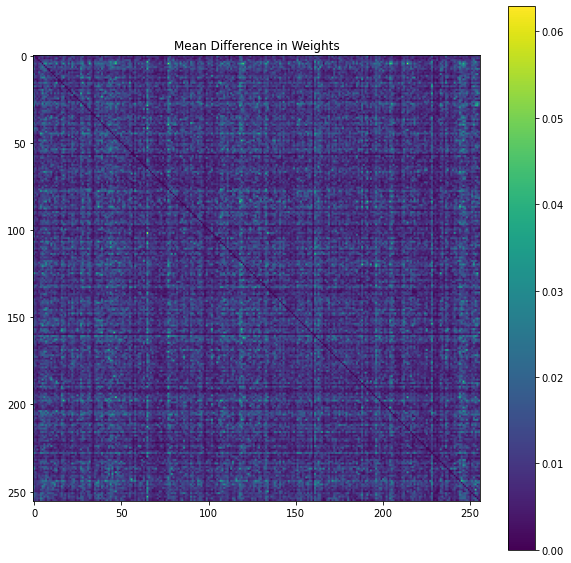

In [37]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
plt.imshow(np.mean(differences_perception,axis=0))
plt.title('Mean Difference in Weights')
plt.colorbar()

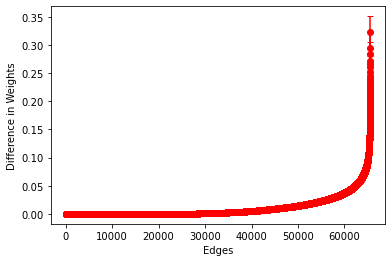

In [38]:
plt.errorbar(range(256**2),np.mean(sorted_differences_perception,axis=0),yerr=np.std(sorted_differences_perception,axis=0),capsize=3,ecolor='r',fmt='ro:')
plt.ylabel('Difference in Weights')
plt.xlabel('Edges')
plt.show()

## Decision Task

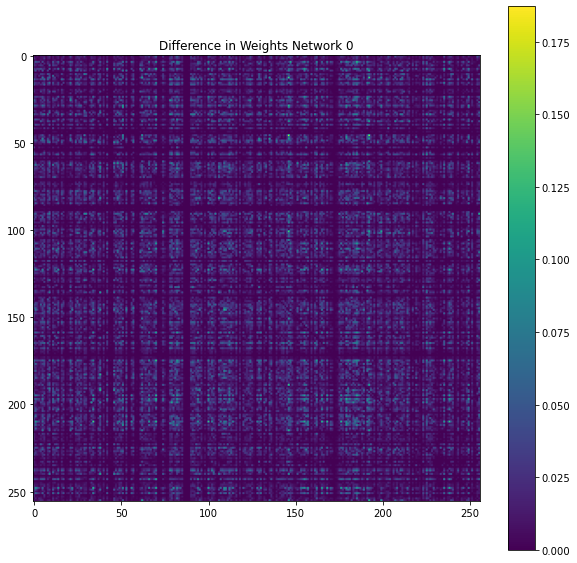

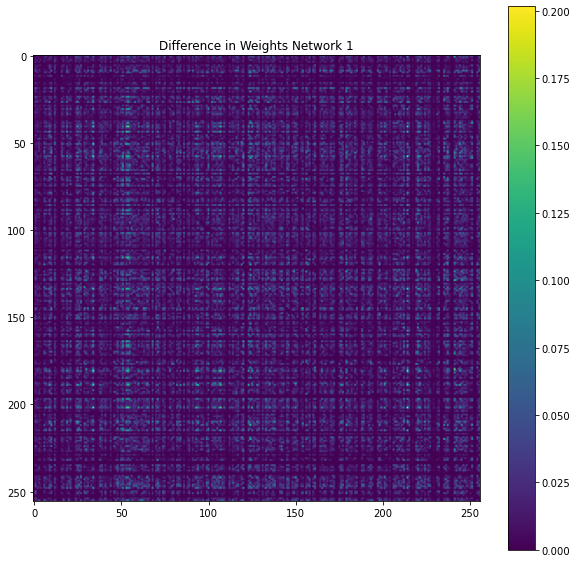

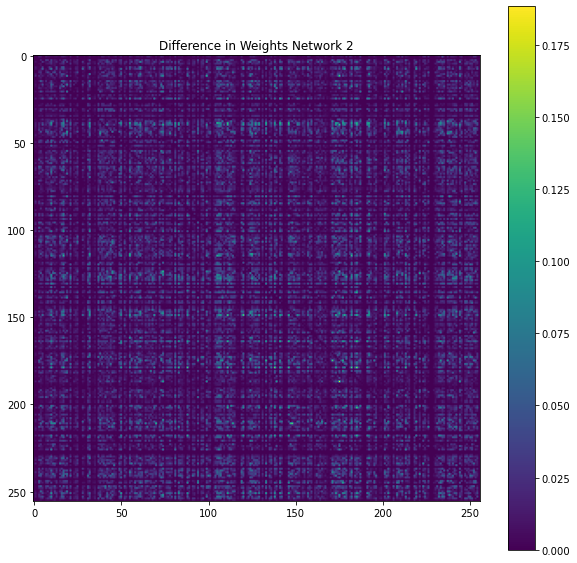

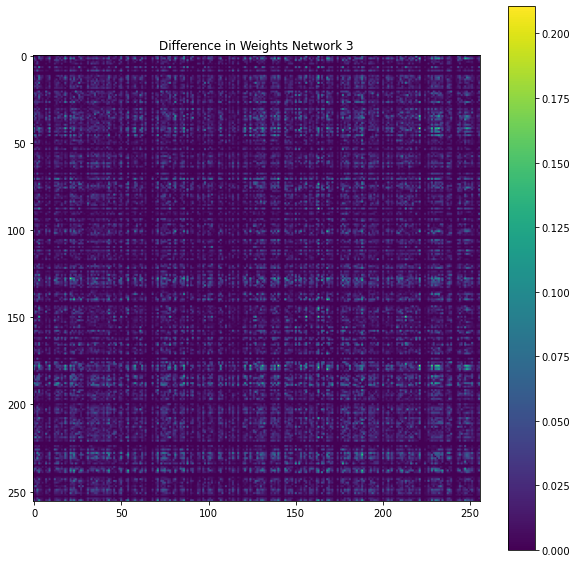

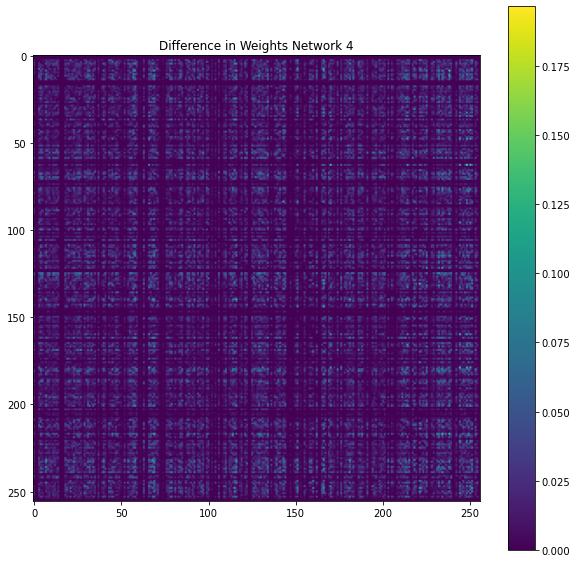

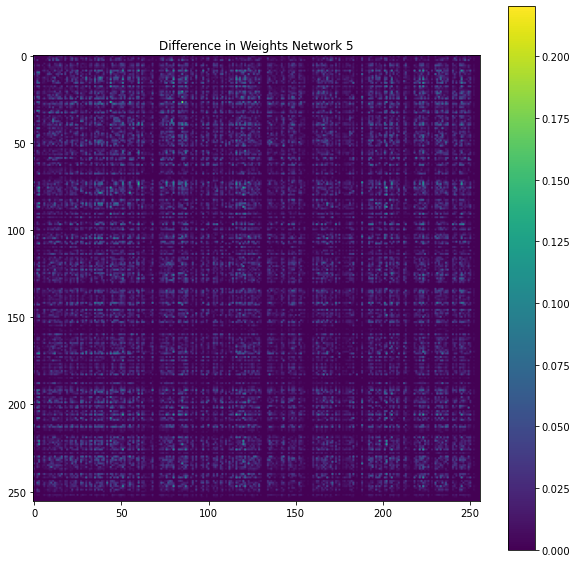

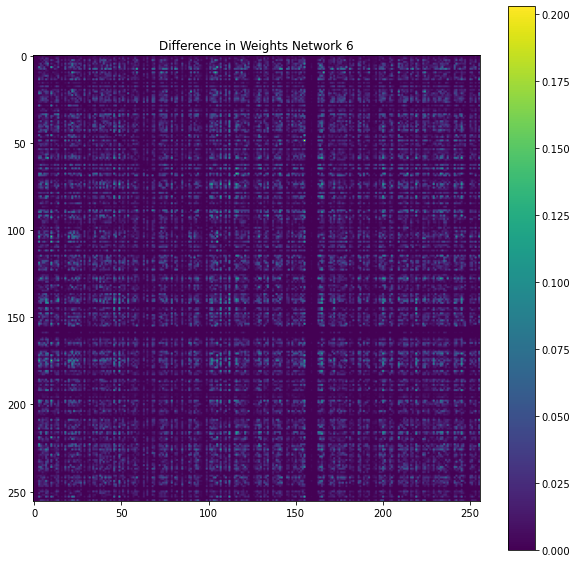

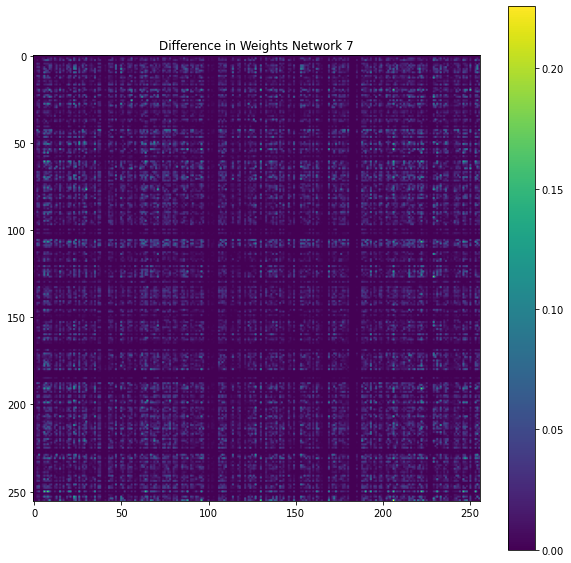

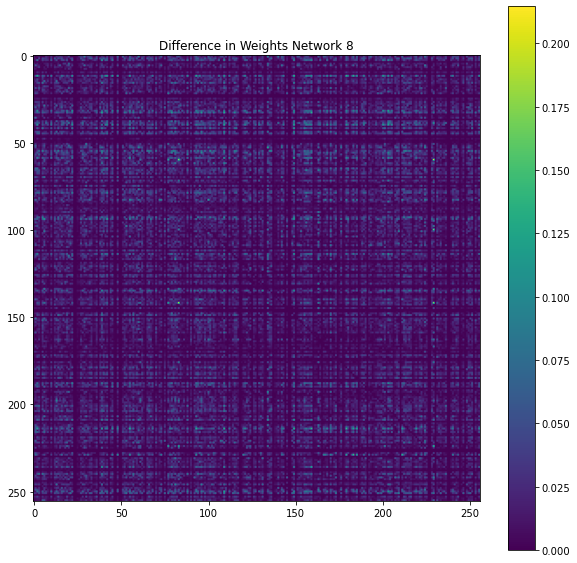

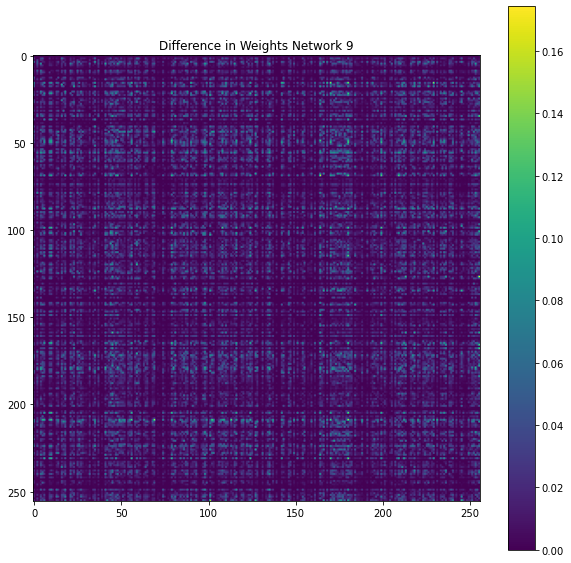

In [39]:
differences_decision = []
sorted_differences_decision = []
for i,weight_history_dict in enumerate(weight_histories_decision):
    weight_histories =weight_history_dict['trained weights']
    difference = np.abs(np.array(weight_histories[0])-np.array(weight_histories[-1]))
    fig, ax = plt.subplots(1,1,figsize=(10,10))
    plt.imshow(difference)
    plt.title('Difference in Weights Network {0}'.format(i))
    plt.colorbar()
    differences_decision.append(difference)
    sorted_diff = np.ndarray.flatten(difference)
    sorted_diff.sort()
    sorted_differences_decision.append(sorted_diff)

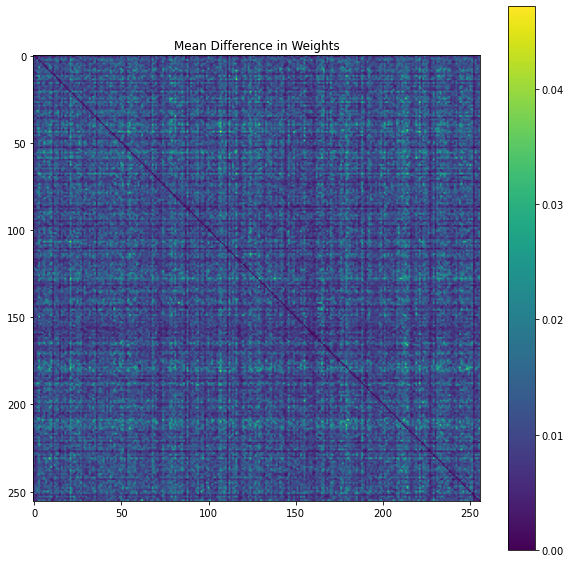

In [40]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
plt.imshow(np.mean(differences_decision,axis=0))
plt.title('Mean Difference in Weights')
plt.colorbar()

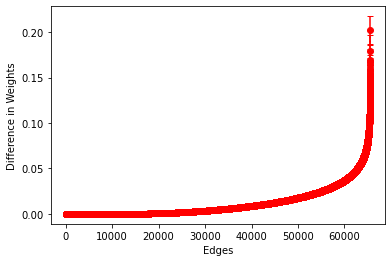

In [41]:
plt.errorbar(range(256**2),np.mean(sorted_differences_decision,axis=0),yerr=np.std(sorted_differences_decision,axis=0),capsize=3,ecolor='r',fmt='ro:')
plt.ylabel('Difference in Weights')
plt.xlabel('Edges')
plt.show()

## Combined

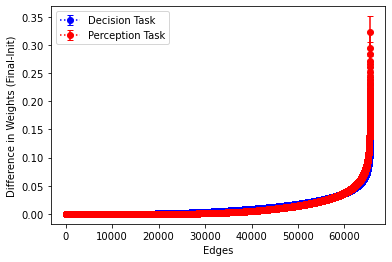

In [185]:
plt.errorbar(range(256**2),np.mean(sorted_differences_decision,axis=0),yerr=np.std(sorted_differences_decision,axis=0),capsize=3,fmt='bo:',label='Decision Task')
plt.errorbar(range(256**2),np.mean(sorted_differences_perception,axis=0),yerr=np.std(sorted_differences_perception,axis=0),capsize=3,fmt='ro:',label='Perception Task')
plt.ylabel('Difference in Weights (Final-Init)')
plt.xlabel('Edges')
plt.legend()
plt.show()

# Number of Clusters when Pruning Weights

## Perception Task

In [28]:
#Only need to run this cell once

thresholds = np.arange(0,1,.005)
num_clusters_mean = []
num_clusters_std = []
for threshold in tqdm(thresholds):
    num_clusters = []
    for weight_history_dict in weight_histories_perception:
        weight_histories = weight_history_dict['trained weights']
        final_weights = weight_histories[-1]
        initial_weights = weight_histories[0]
        final_weights = np.array(final_weights)
        initial_weights = np.array(initial_weights)
        G_final = nx.from_numpy_matrix(final_weights)
        G_initial = nx.from_numpy_matrix(initial_weights)
        edge_weights = nx.get_edge_attributes(G_initial,'weight')
        G_initial.remove_edges_from((e for e, w in edge_weights.items() if w < threshold))
        edge_weights = nx.get_edge_attributes(G_final,'weight')
        G_final.remove_edges_from((e for e, w in edge_weights.items() if w < threshold))
        num_clusters.append([nx.number_connected_components(G_initial), nx.number_connected_components(G_final)])
    num_clusters_mean.append(np.mean(num_clusters,axis=0))
    num_clusters_std.append(np.std(num_clusters,axis=0))

100%|████████████████████████████████████████████████████████████████████████████████| 200/200 [36:41<00:00, 11.01s/it]


In [29]:
num_clusters_mean = np.array(num_clusters_mean)
num_clusters_std = np.array(num_clusters_std)

In [40]:
#np.save('num_clusters_mean_perception', num_clusters_mean)
#np.save('num_clusters_std_perception', num_clusters_std)

In [41]:
num_clusters_mean = np.load('num_clusters_mean_perception.npy')
num_clusters_std = np.load('num_clusters_std_perception.npy')

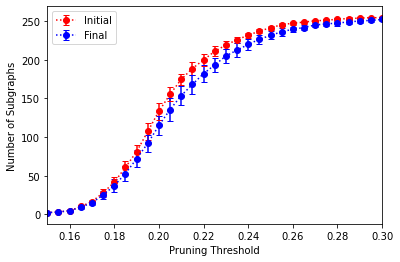

In [42]:
plt.errorbar(thresholds, num_clusters_mean[:,0], yerr = num_clusters_std[:,0],fmt='ro:',capsize=3,label='Initial')
plt.errorbar(thresholds, num_clusters_mean[:,1], yerr = num_clusters_std[:,1],fmt='bo:',capsize=3,label='Final')
plt.legend()
plt.xlabel('Pruning Threshold')
plt.ylabel('Number of Subgraphs')
plt.xlim(0.15,0.3)
plt.show()

## Decision Task

In [43]:
#Only need to run this cell once

thresholds = np.arange(0,1,.005)
num_clusters_mean = []
num_clusters_std = []
for threshold in tqdm(thresholds):
    num_clusters = []
    for weight_history_dict in weight_histories_decision:
        weight_histories = weight_history_dict['trained weights']
        final_weights = weight_histories[-1]
        initial_weights = weight_histories[0]
        final_weights = np.array(final_weights)
        initial_weights = np.array(initial_weights)
        G_final = nx.from_numpy_matrix(final_weights)
        G_initial = nx.from_numpy_matrix(initial_weights)
        edge_weights = nx.get_edge_attributes(G_initial,'weight')
        G_initial.remove_edges_from((e for e, w in edge_weights.items() if w < threshold))
        edge_weights = nx.get_edge_attributes(G_final,'weight')
        G_final.remove_edges_from((e for e, w in edge_weights.items() if w < threshold))
        num_clusters.append([nx.number_connected_components(G_initial), nx.number_connected_components(G_final)])
    num_clusters_mean.append(np.mean(num_clusters,axis=0))
    num_clusters_std.append(np.std(num_clusters,axis=0))

100%|████████████████████████████████████████████████████████████████████████████████| 200/200 [32:26<00:00,  9.73s/it]


In [44]:
num_clusters_mean = np.array(num_clusters_mean)
num_clusters_std = np.array(num_clusters_std)

In [45]:
#np.save('num_clusters_mean_decision', num_clusters_mean)
#np.save('num_clusters_std_decision', num_clusters_std)

In [46]:
num_clusters_mean = np.load('num_clusters_mean_decision.npy')
num_clusters_std = np.load('num_clusters_std_decision.npy')

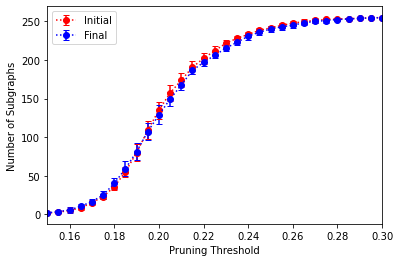

In [47]:
plt.errorbar(thresholds, num_clusters_mean[:,0], yerr = num_clusters_std[:,0],fmt='ro:',capsize=3,label='Initial')
plt.errorbar(thresholds, num_clusters_mean[:,1], yerr = num_clusters_std[:,1],fmt='bo:',capsize=3,label='Final')
plt.legend()
plt.xlabel('Pruning Threshold')
plt.ylabel('Number of Subgraphs')
plt.xlim(0.15,0.3)
plt.show()

## Combined Plot

In [48]:
num_clusters_mean_decision = np.load('num_clusters_mean_decision.npy')
num_clusters_std_decision = np.load('num_clusters_std_decision.npy')
num_clusters_mean_perception = np.load('num_clusters_mean_perception.npy')
num_clusters_std_perception = np.load('num_clusters_std_perception.npy')

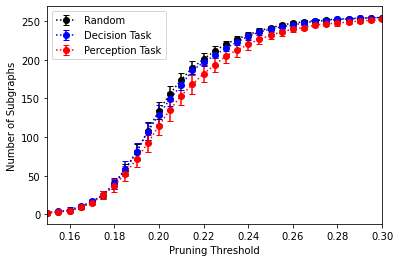

In [49]:
plt.errorbar(thresholds, (num_clusters_mean_perception[:,0]+num_clusters_mean_decision[:,0])/2, yerr = (num_clusters_std_perception[:,0]+num_clusters_std_decision[:,0])/2,fmt='ko:',capsize=3,label='Random')
plt.errorbar(thresholds, num_clusters_mean_decision[:,1], yerr = num_clusters_std_decision[:,1],fmt='bo:',capsize=3,label='Decision Task')
plt.errorbar(thresholds, num_clusters_mean_perception[:,1], yerr = num_clusters_std_perception[:,1],fmt='ro:',capsize=3,label='Perception Task')
plt.legend()
plt.xlabel('Pruning Threshold')
plt.ylabel('Number of Subgraphs')
plt.xlim(0.15,0.3)
plt.show()

# Clustering Coefficients

## Perception Task

In [167]:
coeffs_init = []
coeffs_final = []
for weight_history_dict in tqdm(weight_histories_perception):
    weight_histories = weight_history_dict['trained weights']
    final_weights = weight_histories[-1]
    initial_weights = weight_histories[0]
    final_weights = np.array(final_weights)
    initial_weights = np.array(initial_weights)
    G_final = nx.from_numpy_matrix(final_weights)
    G_initial = nx.from_numpy_matrix(initial_weights)
    clustering_coeffs_final = list(nx.algorithms.cluster.clustering(G_final,weight='weight').values())
    clustering_coeffs_init = list(nx.algorithms.cluster.clustering(G_initial,weight='weight').values())
    coeffs_init.append(clustering_coeffs_init)
    coeffs_final.append(clustering_coeffs_final)
coeffs_init=np.array(coeffs_init)
coeffs_final=np.array(coeffs_final)
subtracted = coeffs_final-coeffs_init
coeffs_init=np.ndarray.flatten(coeffs_init)
coeffs_final=np.ndarray.flatten(coeffs_final)
subtracted.sort(axis=1)
subtracted_mean = np.mean(subtracted,axis=0)
subtracted_std=np.std(subtracted,axis=0)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [12:05<00:00, 72.57s/it]


In [168]:
#np.save('clustering_subtracted_mean_perception', subtracted_mean)
#np.save('clustering_subtracted_std_perception', subtracted_std)

#np.save('clustering_coeffs_init_perception', coeffs_init)
#np.save('clustering_coeffs_final_perception', coeffs_final)

In [69]:
subtracted_mean = np.load('clustering_subtracted_mean_perception.npy')
subtracted_std = np.load('clustering_subtracted_std_perception.npy')

coeffs_init = np.load('clustering_coeffs_init_perception.npy')
coeffs_final = np.load('clustering_coeffs_final_perception.npy')

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\ma\core.py:3337: ComplexWarning: Casting complex values to real discards the imaginary part
  _data[indx] = dval


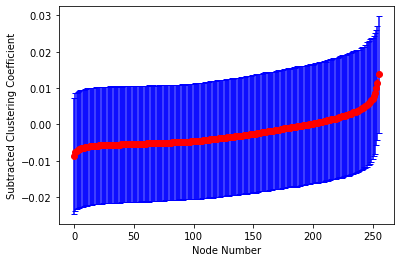

In [170]:
plt.errorbar(range(num_nodes),subtracted_mean,fmt='ro:',yerr=subtracted_std,capsize=3,ecolor='b')
plt.xlabel('Node Number')
plt.ylabel('Subtracted Clustering Coefficient')
plt.show()

Scatter for single network - just to test

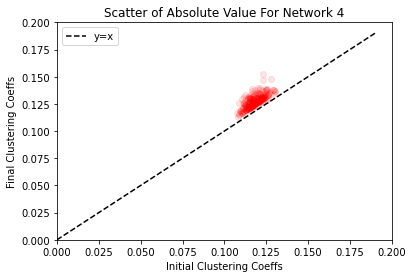

In [74]:
net_num = 4
plt.errorbar(np.abs(coeffs_init[256*net_num:256*(net_num+1)]), np.abs(coeffs_final[256*net_num:256*(net_num+1)]),fmt='ro', alpha=0.1)
plt.plot(np.arange(0,.2,.01),np.arange(0,.2,.01),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Clustering Coeffs')
plt.ylabel('Final Clustering Coeffs')
plt.xlim(0,.2)
plt.ylim(0,.2)
plt.title('Scatter of Absolute Value For Network {0}'.format(net_num))
plt.legend()
plt.show()

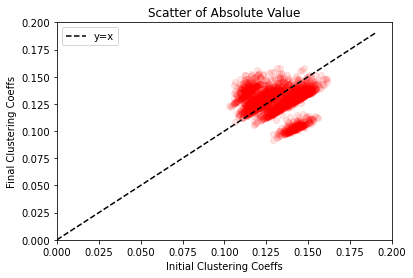

In [70]:
plt.errorbar(np.abs(coeffs_init), np.abs(coeffs_final),fmt='ro', alpha=0.1)
plt.plot(np.arange(0,.2,.01),np.arange(0,.2,.01),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Clustering Coeffs')
plt.ylabel('Final Clustering Coeffs')
plt.xlim(0,.2)
plt.ylim(0,.2)
plt.title('Scatter of Absolute Value')
plt.legend()
plt.show()

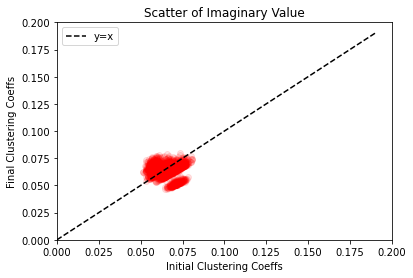

In [61]:
plt.errorbar(np.imag(coeffs_init), np.imag(coeffs_final),fmt='ro', alpha=0.1)
plt.plot(np.arange(0,.2,.01),np.arange(0,.2,.01),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Clustering Coeffs')
plt.ylabel('Final Clustering Coeffs')
plt.xlim(0,.2)
plt.ylim(0,.2)
plt.title('Scatter of Imaginary Value')
plt.legend()
plt.show()

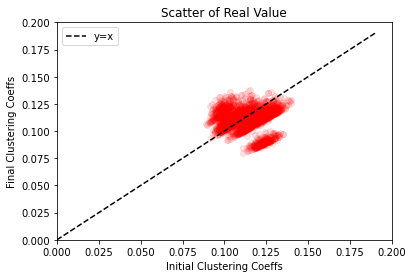

In [62]:
plt.errorbar(np.real(coeffs_init), np.real(coeffs_final),fmt='ro', alpha=0.1)
plt.plot(np.arange(0,.2,.01),np.arange(0,.2,.01),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Clustering Coeffs')
plt.ylabel('Final Clustering Coeffs')
plt.xlim(0,.2)
plt.ylim(0,.2)
plt.title('Scatter of Real Value')
plt.legend()
plt.show()

## Decision Task

In [172]:
coeffs_init = []
coeffs_final = []
for weight_history_dict in tqdm(weight_histories_decision):
    weight_histories = weight_history_dict['trained weights']
    final_weights = weight_histories[-1]
    initial_weights = weight_histories[0]
    final_weights = np.array(final_weights)
    initial_weights = np.array(initial_weights)
    G_final = nx.from_numpy_matrix(final_weights)
    G_initial = nx.from_numpy_matrix(initial_weights)
    clustering_coeffs_final = list(nx.algorithms.cluster.clustering(G_final,weight='weight').values())
    clustering_coeffs_init = list(nx.algorithms.cluster.clustering(G_initial,weight='weight').values())
    coeffs_init.append(clustering_coeffs_init)
    coeffs_final.append(clustering_coeffs_final)
coeffs_init=np.array(coeffs_init)
coeffs_final=np.array(coeffs_final)
subtracted = coeffs_final-coeffs_init
coeffs_init=np.ndarray.flatten(coeffs_init)
coeffs_final=np.ndarray.flatten(coeffs_final)
subtracted.sort(axis=1)
subtracted_mean = np.mean(subtracted,axis=0)
subtracted_std=np.std(subtracted,axis=0)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [13:05<00:00, 78.54s/it]


In [173]:
#np.save('clustering_subtracted_mean_decision', subtracted_mean)
#np.save('clustering_subtracted_std_decision', subtracted_std)

#np.save('clustering_coeffs_init_decision', coeffs_init)
#np.save('clustering_coeffs_final_decision', coeffs_final)

In [75]:
subtracted_mean = np.load('clustering_subtracted_mean_decision.npy')
subtracted_std = np.load('clustering_subtracted_std_decision.npy')

coeffs_init = np.load('clustering_coeffs_init_decision.npy')
coeffs_final = np.load('clustering_coeffs_final_decision.npy')

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\ma\core.py:3337: ComplexWarning: Casting complex values to real discards the imaginary part
  _data[indx] = dval


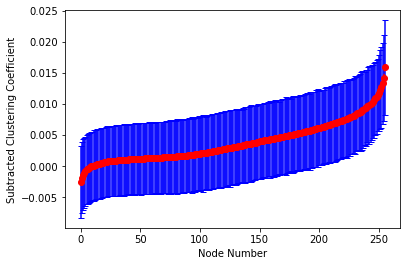

In [175]:
plt.errorbar(range(num_nodes),subtracted_mean,fmt='ro:',yerr=subtracted_std,capsize=3,ecolor='b')
plt.xlabel('Node Number')
plt.ylabel('Subtracted Clustering Coefficient')
plt.show()

Scatter for single network - just to test

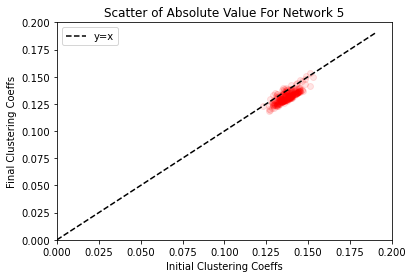

In [77]:
net_num = 5
plt.errorbar(np.abs(coeffs_init[256*net_num:256*(net_num+1)]), np.abs(coeffs_final[256*net_num:256*(net_num+1)]),fmt='ro', alpha=0.1)
plt.plot(np.arange(0,.2,.01),np.arange(0,.2,.01),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Clustering Coeffs')
plt.ylabel('Final Clustering Coeffs')
plt.xlim(0,.2)
plt.ylim(0,.2)
plt.title('Scatter of Absolute Value For Network {0}'.format(net_num))
plt.legend()
plt.show()

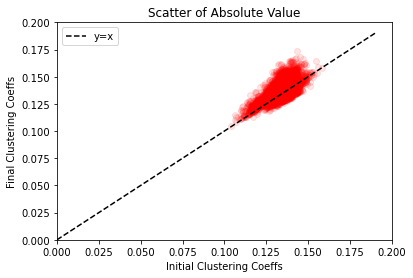

In [64]:
plt.errorbar(np.abs(coeffs_init), np.abs(coeffs_final),fmt='ro',alpha = 0.1)
plt.plot(np.arange(0,.2,.01),np.arange(0,.2,.01),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Clustering Coeffs')
plt.ylabel('Final Clustering Coeffs')
plt.title('Scatter of Absolute Value')
plt.xlim(0,.2)
plt.ylim(0,.2)
plt.legend()
plt.show()

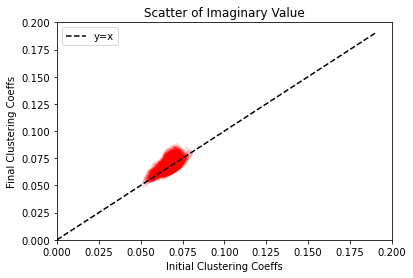

In [65]:
plt.errorbar(np.imag(coeffs_init), np.imag(coeffs_final),fmt='ro',alpha = 0.1)
plt.plot(np.arange(0,.2,.01),np.arange(0,.2,.01),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Clustering Coeffs')
plt.ylabel('Final Clustering Coeffs')
plt.title('Scatter of Imaginary Value')
plt.xlim(0,.2)
plt.ylim(0,.2)
plt.legend()
plt.show()

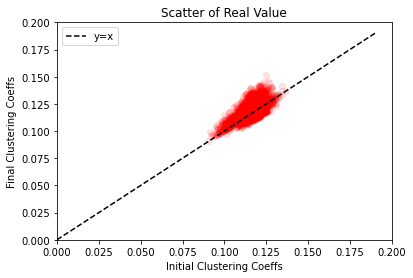

In [66]:
plt.errorbar(np.real(coeffs_init), np.real(coeffs_final),fmt='ro',alpha = 0.1)
plt.plot(np.arange(0,.2,.01),np.arange(0,.2,.01),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Clustering Coeffs')
plt.ylabel('Final Clustering Coeffs')
plt.title('Scatter of Real Value')
plt.xlim(0,.2)
plt.ylim(0,.2)
plt.legend()
plt.show()

# Weighted Centralities (Current Flow-Betweeness)

Getting differences per node (from prev. analysis):

In [108]:
net_row_diffs = []
net_col_diffs = []
net_mean_diffs = []
for net in range(num_networks):
    diff = differences_decision[net]
    row_diffs = []
    col_diffs = []
    mean_diffs = []
    for node in range(num_nodes):
        row = diff[node]
        col = diff[:,node]
        row_diffs.append(np.mean(row))
        col_diffs.append(np.mean(col))
        mean_diffs.append(np.mean((row+col)/2))
    net_row_diffs.append(row_diffs)
    net_col_diffs.append(col_diffs)
    net_mean_diffs.append(mean_diffs)

net_row_diffs = np.ndarray.flatten(np.array(net_row_diffs))
net_col_diffs = np.ndarray.flatten(np.array(net_col_diffs))
net_mean_diffs = np.ndarray.flatten(np.array(net_mean_diffs))

## Perception Task

In [155]:
coeffs_init = []
coeffs_final = []
for weight_history_dict in tqdm(weight_histories_perception):
    weight_histories = weight_history_dict['trained weights']
    final_weights = weight_histories[-1]
    initial_weights = weight_histories[0]
    final_weights = np.array(final_weights)
    initial_weights = np.array(initial_weights)
    G_final = nx.from_numpy_matrix(final_weights)
    G_initial = nx.from_numpy_matrix(initial_weights)
    center_coeffs_final = list(nx.algorithms.centrality.current_flow_betweenness_centrality(G_final,weight='weight').values())
    center_coeffs_init = list(nx.algorithms.centrality.current_flow_betweenness_centrality(G_initial,weight='weight').values())
    coeffs_init.append(center_coeffs_init)
    coeffs_final.append(center_coeffs_final)
coeffs_init=np.array(coeffs_init)
coeffs_final=np.array(coeffs_final)
subtracted = coeffs_final-coeffs_init
coeffs_init=np.ndarray.flatten(coeffs_init)
coeffs_final=np.ndarray.flatten(coeffs_final)
subtracted.sort(axis=1)
subtracted_mean = np.mean(subtracted,axis=0)
subtracted_std=np.std(subtracted,axis=0)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [10:01<00:00, 60.14s/it]


AxisError: axis 1 is out of bounds for array of dimension 1

In [156]:
#np.save('centrality_subtracted_mean_perception', subtracted_mean)
#np.save('centrality_subtracted_std_perception', subtracted_std)

#np.save('centrality_coeffs_init_perception', coeffs_init)
#np.save('centrality_coeffs_final_perception', coeffs_final)

In [109]:
subtracted_mean = np.load('centrality_subtracted_mean_perception.npy')
subtracted_std = np.load('centrality_subtracted_std_perception.npy')

coeffs_init = np.load('centrality_coeffs_init_perception.npy')
coeffs_final = np.load('centrality_coeffs_final_perception.npy')

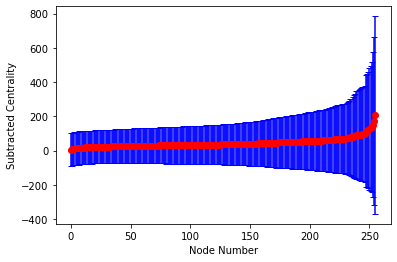

In [154]:
plt.errorbar(range(num_nodes),subtracted_mean,fmt='ro:',yerr=subtracted_std,capsize=3,ecolor='b')
plt.xlabel('Node Number')
plt.ylabel('Subtracted Centrality')
#plt.ylim(-20,30)
plt.show()

Plotting for a single network-

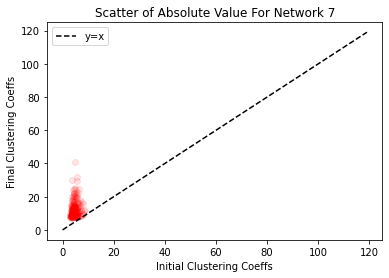

In [105]:
net_num = 7
plt.errorbar(np.abs(coeffs_init[256*net_num:256*(net_num+1)]), np.abs(coeffs_final[256*net_num:256*(net_num+1)]),fmt='ro', alpha=0.1)
plt.plot(np.arange(0,120),np.arange(0,120),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Clustering Coeffs')
plt.ylabel('Final Clustering Coeffs')
#plt.xlim(0,.2)
#plt.ylim(0,.2)
plt.title('Scatter of Absolute Value For Network {0}'.format(net_num))
plt.legend()
plt.show()

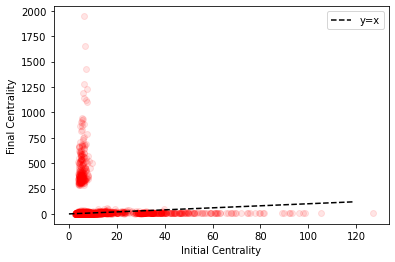

In [106]:
plt.errorbar(coeffs_init, coeffs_final,fmt='ro', alpha=0.1)
plt.plot(np.arange(0,120),np.arange(0,120),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Centrality')
plt.ylabel('Final Centrality')
#plt.xlim(-5,10)
#plt.ylim(-10,35)
plt.legend()
plt.show()

Colorbar is mean difference of weights connected to that node

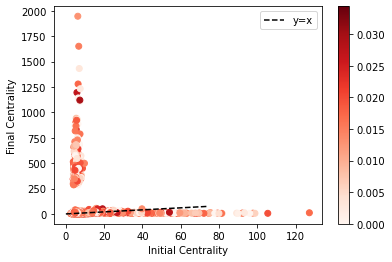

In [113]:
cm = plt.cm.get_cmap('Reds')
z = net_mean_diffs

sc=plt.scatter(coeffs_init, coeffs_final,c=z,cmap = cm, alpha = 1)
plt.colorbar(sc)
plt.plot(np.arange(0,75),np.arange(0,75),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Centrality')
plt.ylabel('Final Centrality')
#plt.xlim(-5,10)
#plt.ylim(-10,35)
plt.legend()
plt.show()

## Decision Task

In [160]:
coeffs_init = []
coeffs_final = []
for weight_history_dict in tqdm(weight_histories_decision):
    weight_histories = weight_history_dict['trained weights']
    final_weights = weight_histories[-1]
    initial_weights = weight_histories[0]
    final_weights = np.array(final_weights)
    initial_weights = np.array(initial_weights)
    G_final = nx.from_numpy_matrix(final_weights)
    G_initial = nx.from_numpy_matrix(initial_weights)
    center_coeffs_final = list(nx.algorithms.centrality.current_flow_betweenness_centrality(G_final,weight='weight').values())
    center_coeffs_init = list(nx.algorithms.centrality.current_flow_betweenness_centrality(G_initial,weight='weight').values())
    coeffs_init.append(center_coeffs_init)
    coeffs_final.append(center_coeffs_final)
coeffs_init=np.array(coeffs_init)
coeffs_final=np.array(coeffs_final)
subtracted = coeffs_final-coeffs_init
coeffs_init=np.ndarray.flatten(coeffs_init)
coeffs_final=np.ndarray.flatten(coeffs_final)
subtracted.sort(axis=1)
subtracted_mean = np.mean(subtracted,axis=0)
subtracted_std=np.std(subtracted,axis=0)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [10:35<00:00, 63.51s/it]


In [161]:
#np.save('centrality_subtracted_mean_decision', subtracted_mean)
#np.save('centrality_subtracted_std_decision', subtracted_std)

#np.save('centrality_coeffs_init_decision', coeffs_init)
#np.save('centrality_coeffs_final_decision', coeffs_final)

In [87]:
subtracted_mean = np.load('centrality_subtracted_mean_decision.npy')
subtracted_std = np.load('centrality_subtracted_std_decision.npy')

coeffs_init = np.load('centrality_coeffs_init_decision.npy')
coeffs_final = np.load('centrality_coeffs_final_decision.npy')

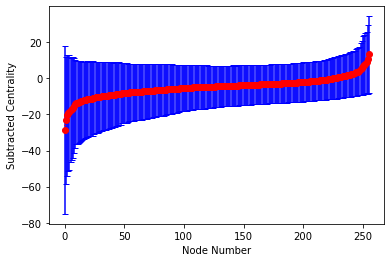

In [163]:
plt.errorbar(range(num_nodes),subtracted_mean,fmt='ro:',yerr=subtracted_std,capsize=3,ecolor='b')
plt.xlabel('Node Number')
plt.ylabel('Subtracted Centrality')
plt.show()

Plotting for a single network-

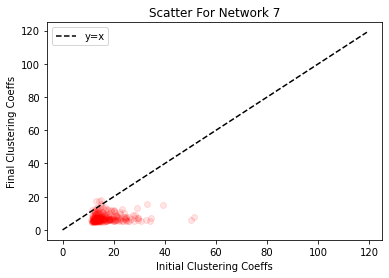

In [101]:
net_num = 7
plt.errorbar(np.abs(coeffs_init[256*net_num:256*(net_num+1)]), np.abs(coeffs_final[256*net_num:256*(net_num+1)]),fmt='ro', alpha=0.1)
plt.plot(np.arange(0,120),np.arange(0,120),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Clustering Coeffs')
plt.ylabel('Final Clustering Coeffs')
#plt.xlim(0,.2)
#plt.ylim(0,.2)
plt.title('Scatter For Network {0}'.format(net_num))
plt.legend()
plt.show()

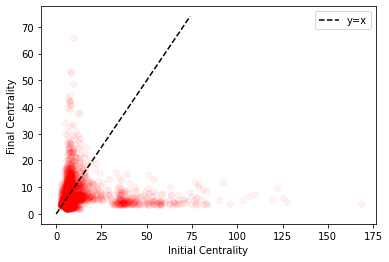

In [103]:
plt.errorbar(coeffs_init, coeffs_final,fmt='ro',alpha=0.05)
plt.plot(np.arange(0,75),np.arange(0,75),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Centrality')
plt.ylabel('Final Centrality')
#plt.xlim(-5,10)
#plt.ylim(-10,35)
plt.legend()
plt.show()

Colorbar represents how much weights were changed during training for that node

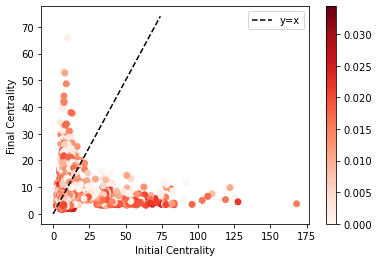

In [99]:
cm = plt.cm.get_cmap('Reds')
z = net_mean_diffs

sc=plt.scatter(coeffs_init, coeffs_final,c=z,cmap = cm, alpha = 1)
plt.colorbar(sc)
plt.plot(np.arange(0,75),np.arange(0,75),'k--',zorder=3,label='y=x')
plt.xlabel('Initial Centrality')
plt.ylabel('Final Centrality')
#plt.xlim(-5,10)
#plt.ylim(-10,35)
plt.legend()
plt.show()